# NST (Neural Style Transfer) - AdaIN (Adaptive Instance NORM)

### Prerequisites
* DL Basics: CNN
* Python & Pytorch
* Flask

### Resources
* 16 GB GPU
* Free resources

### Roadmap
* Problem Definition
* Types of NST
* AdaIN: Theory
* Implementation: Line by line
    * Web App
    * Deployment
    * Next Steps: Implement

---

## Problem Definition
Given $(C, S) \rightarrow G$
* **Content** of $C$ is preserved
* **Style** of $S$ is preserved

1. Separate content & style
2. Reconstruct $G$

---

## Optimization Formulation
$$I \rightarrow Y$$
$$Y^* = \arg\min_{Y} L(I, Y)$$

$$G^* = \arg\min_{G} L_c(C, G) \cdot \lambda_c + L_s(S, G) \cdot \lambda_s$$

*Where:*
* $C$ = Content Image
* $S$ = Style Image
* $G$ = Generated Image
* $\lambda$ = Weight

---

## What is "Content" vs "Style"?

### Content
* Spatial arrangement
* Objects
* Layout

### Style
* Paint strokes
* Colors used
* Texture

---

## Why NST is Hard
* Separate content & style
* True Labels / No true loss
* Style loss is subjective

---

## Evaluation Metrics

### Qualitative
* Visual appeal and artistic quality

### Quantitative
* Speed
* Scalability
* Flexibility
* Training Time

---

## Visual Examples and Use Cases
* Photo Filters
* Animation
* Films / Games Generation

## Types of Neural Style Transfer Methods

### 1. Optimization-based NST (Gatys et al.)
* Iterative methods that directly optimize pixel values for each transfer.

### 2. Feed-forward Per-Style Models (Johnson et al.)
* Faster, but requires a separate model for each style image.

### 3. Arbitrary Style Transfer Methods
* Enabling style transfer with any given style image in real-time.

---
    
# Optimization-based NST (Gatys et al.)

## 1. Objective & Loss Formulation
The goal is to directly optimize the pixel values of a randomly initialized image until it matches the content of image $C$ and the style of image $S$.

$$L_{\text{total}} = \lambda_c L_c(C, G) + \lambda_s L_s(S, G)$$

## 2. Feature Maps and Gram Matrix
To calculate the losses, intermediate representations (feature maps) are extracted from a pre-trained CNN:
* **Shape of Feature Map:** An original activation tensor has dimensions $C \times H \times W$ (Channels $\times$ Height $\times$ Width).
* **Flattening:** It is reshaped into a 2D matrix of size $C \times (H \times W)$ to capture spatial statistics easily.
* Let $f_L(G)$ be the feature map of the generated image at layer $L$, and $f'_L(G)$ represent its flattened format.

### Style Representation (Gram Matrix)
Style is captured using a **Gram Matrix** $G(f)$, which computes the inner product (correlation) between different channel features:
$$G(f) = f \cdot f^T$$

The style loss at a specific layer is the squared difference between the Gram matrix of the style image and the Gram matrix of the generated image:
$$L_{\text{style}} = \left\| G\left(f'_L(S)\right) - G\left(f_L(G)\right) \right\|^2$$

## 3. The Iterative Algorithm

The process operates directly on the pixel space of the generated image through an optimization loop:

* **Step 1:** Initialize $G$ as a random noise image or a copy of the content image.
* **Step 2:** Pass the Content image ($C$), Style image ($S$), and Generated image ($G$) forward through a fixed CNN (like VGG-19) to get intermediate layers.
* **Step 3:** Calculate content and style losses using the extracted feature maps.
* **Step 4:** Backpropagate the gradients **all the way back to the image pixels of $G$** (the CNN weights stay completely frozen).
* **Step 5:** Repeat this update process 500 to 1000 times until a visually appealing result emerges.

---

# Feed-forward Per-Style Models (Johnson et al.)

## 1. Architectural Strategy
To achieve **Real-time NST**, Johnson et al. replaced the slow optimization loop with a fast, feed-forward network called an **Image Transform Network** ($f_W$).

* **Input ($x$):** The Content Image.
* **Output ($G$):** The final stylized output image.

## 2. Training and Loss Network
Instead of calculating the loss on the image pixels directly during inference, a separate pre-trained **Loss Network** (VGG) is used to train $f_W$:

$$(G, C, S) \rightarrow \text{VGG} \rightarrow \text{Features} \rightarrow \text{Loss Evaluation}$$

* **Core Constraint:** The style image ($S$) is **fixed/frozen** during the entire training phase of the Image Transform Network. 
* **Inference Benefit:** Once trained, a content image $x$ can be passed through $f_W$ in a single forward pass to get $G$ instantly.

---

# AdaIN: Core Theory and Intuition

Architecture: https://miro.medium.com/v2/resize:fit:758/1*W_Z25HwwdVmA24ltnCVBJA.png

## 1. Feature Statistics as Style
The core breakthrough of Adaptive Instance Normalization (AdaIN) is that **the style of an image is captured entirely by its channel-wise feature statistics** (Mean, Variance, and Standard Deviation).

Let the content feature map be $f_c$ and the style feature map be $f_s$:
* $f_c \in \mathbb{R}^{C \times H \times W}$
* $f_s \in \mathbb{R}^{C \times H \times W}$

Where $\mu(f)_i$ represents the mean computed independently for each channel $c$.

Standard normalization rescales an input $x$ to have zero mean and unit variance:
$$\hat{x} = \frac{x - \mu}{\sigma}$$



## 2. The AdaIN Layer
The AdaIN layer receives content features $f_c$ and style features $f_s$. It normalizes the content features to strip away its original style, and then shifts and scales them to match the exact statistical profile of the style features.

$$\text{AdaIN}(f_c, f_s) = \sigma(f_s) \odot \left( \frac{f_c - \mu(f_c)}{\sigma(f_c)} \right) + \mu(f_s)$$

*Where:*
* $\mu(f_c), \sigma(f_c)$ are the channel-wise mean and standard deviation of the content image.
* $\mu(f_s), \sigma(f_s)$ are the channel-wise mean and standard deviation of the style image.
* $\odot$ represents element-wise multiplication.

---

# AdaIN: The Architecture & Algorithm

The system relies on a frozen **Encoder ($E$)**, a trainable **Decoder ($D$)**, and the intermediate **AdaIN** layer.

## 1. Step-by-Step Pipeline
1. Extract content and style features using a pre-trained, frozen VGG Encoder:
   $$f_c = E(C), \quad f_s = E(S)$$
2. Align the statistics in the AdaIN layer to create the target normalized tensor $t$:
   $$t = \text{AdaIN}(f_c, f_s)$$
3. Pass the fused tensor $t$ through a trainable Decoder to construct the final stylized image $G$:
   $$G = D(t)$$

## 2. Network Diagram
![AdaIN Network Diagram](INSERT_IMAGE_URL_HERE)

* **VGG Encoder:** Frozen (Weights do not update).
* **Decoder:** Trainable (Learns how to map normalized features back into real pixel space).

---

# Loss Function and Training Loop

The network is trained end-to-end by feeding the generated image $G$ back through the frozen VGG network to enforce matching properties.

## 1. Content Loss
The decoder is trained to make sure the structural content of $t$ is preserved in the final image. It is computed as the Euclidean distance between the features of the generated image and the target tensor $t$:
$$L_{\text{content}} = \| f(G) - t \|^2$$

## 2. Style Loss
Instead of using complex Gram matrices, style loss is computed by directly measuring the difference between the mean and standard deviation profiles across all layers ($l$):
$$L_{\text{style}} = \sum_{l} \left( \| \mu(f(G)) - \mu(f(S)) \|^2 + \| \sigma(f(G)) - \sigma(f(S)) \|^2 \right)$$

## 3. Total Loss Function
$$L = \lambda_c L_c + \lambda_s L_s$$
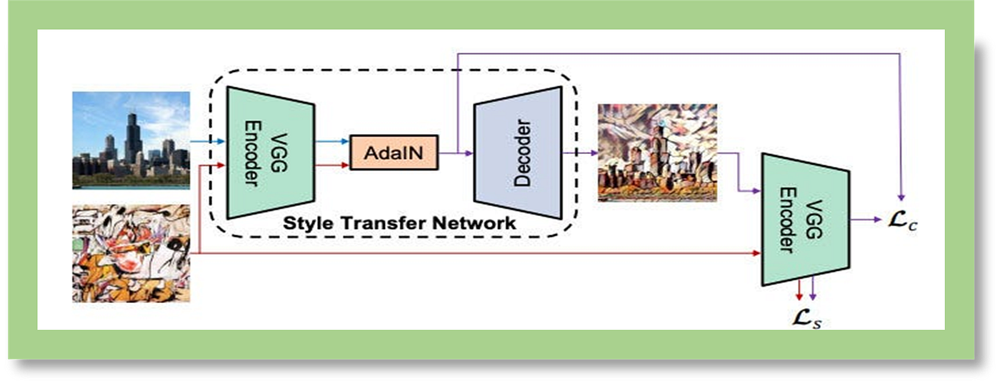
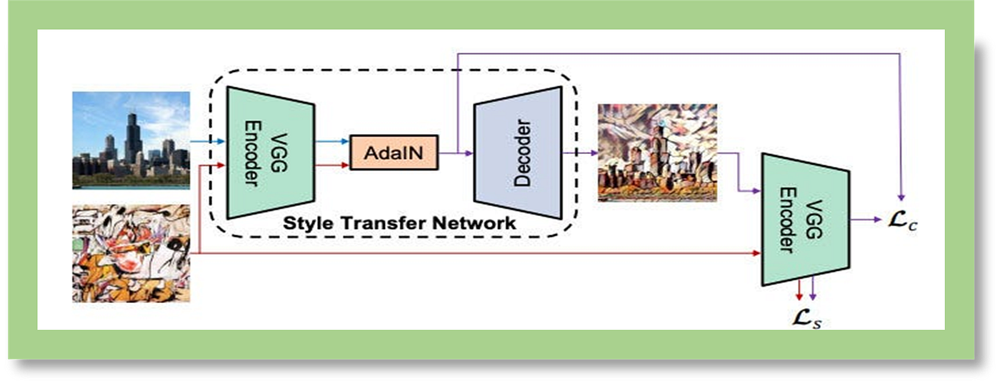

# Project Implementation Checklist

* **Basic Setup**
    * Create basic arguments
    * Experiment Directory
* **Datasets & Dataloaders**

---

* **Model Architecture**
    * Encoder
    * Decoder
* **Optimizer**
* **LR (Learning Rate) Scheduler**

---

* **Loss Function**
* **Training Loop**
* **AdaIN Layer**

---

* **Model Checkpoints**
* **Resume Functionality**
* **Training Methodology**

---

* **Fixing Errors**
* **Final Training Run**
* **Outputs**

## 1. Initialization and configuration setup for a NST training or testing workflow

In [1]:
!mkdir utils

## 2. Load and Preprocess images from a specific folder on your computer so they can be fed into a machine learning model.


In [2]:
%%writefile utils/utils.py

from torch.utils.data import Dataset
import os
from PIL import Image, ImageFile
from torchvision import transforms
ImageFile.LOAD_TRUNCATED_IMAGES = True

class ImageFolderDataset(Dataset):
    def __init__(self, root, transform = None):
        super(ImageFolderDataset, self).__init__()
        self.root = root
        self.transform = transform
        self.files = list(os.listdir(root))
        self.files = [p for p in self.files if p.endswith(('.jpg', '.png', '.jpeg'))]
        
    def __len__(self):
        return len(self.files)


    def __getitem__(self, idx):

        while True:
            try:
                image_path = os.path.join(self.root, self.files[idx])
                image = Image.open(image_path).convert('RGB')
    
                if self.transform:
                    image = self.transform(image)
    
                return image
    
            except Exception as e:
                print(f"Skipping corrupted image: {image_path}")
                print(e)
    
                idx = (idx + 1) % len(self.files)


def get_transform(size, crop, final_size):
    transform_list = []
    if size > 0:
        transform_list.append(transforms.Resize(size))
    if crop:
        transform_list.append(transforms.RandomCrop(final_size))
    else: 
        transform_list.append(transforms.Resize(final_size))
         
    transform_list.append(transforms.ToTensor())
    return transforms.Compose(transform_list)


def adaptive_instance_normalization(content_feat, style_feat):
    # [batch size, channels, h, w]
    size = content_feat.size()
    style_mean, style_std = calc_mean_std(style_feat)
    content_mean, content_std = calc_mean_std(content_feat)
    normalized_content_feat = (content_feat - content_mean.expand(size)) / content_std.expand(size)
    return normalized_content_feat * style_std.expand(size) + style_mean.expand(size)


def calc_mean_std(feat, eps=1e-5):
    # [batch size, channels, h, w]
    size = feat.size()
    assert (len(size) == 4)
    batch_size, channels = size[:2]
    feat_mean = feat.view(batch_size, channels, -1).mean(dim=2).view(batch_size, channels, 1, 1)
    feat_var = feat.view(batch_size, channels, -1).var(dim=2, unbiased=False) + eps
    feat_std = feat_var.sqrt().view(batch_size, channels, 1, 1)
    return feat_mean, feat_std

Writing utils/utils.py


In [3]:
%run utils/utils.py

## Implement Encoder and Decoder

In [4]:
%%writefile utils/models.py

import torch.nn as nn
import torch

# Initialize the ENCODER 
class VGGEncoder(nn.Module):
    def __init__(self, vgg_path):
        super(VGGEncoder, self).__init__()

        self.vgg = nn.Sequential(
            nn.Conv2d(3, 3, (1, 1)),
            nn.ReflectionPad2d((1, 1, 1, 1)),
            nn.Conv2d(3, 64, (3, 3)),
            nn.ReLU(),  # relu1-1
            nn.ReflectionPad2d((1, 1, 1, 1)),
            nn.Conv2d(64, 64, (3, 3)),
            nn.ReLU(),  # relu1-2
            nn.MaxPool2d((2, 2), (2, 2), (0, 0), ceil_mode=True),
            nn.ReflectionPad2d((1, 1, 1, 1)),
            nn.Conv2d(64, 128, (3, 3)),
            nn.ReLU(),  # relu2-1
            nn.ReflectionPad2d((1, 1, 1, 1)),
            nn.Conv2d(128, 128, (3, 3)),
            nn.ReLU(),  # relu2-2
            nn.MaxPool2d((2, 2), (2, 2), (0, 0), ceil_mode=True),
            nn.ReflectionPad2d((1, 1, 1, 1)),
            nn.Conv2d(128, 256, (3, 3)),
            nn.ReLU(),  # relu3-1
            nn.ReflectionPad2d((1, 1, 1, 1)),
            nn.Conv2d(256, 256, (3, 3)),
            nn.ReLU(),  # relu3-2
            nn.ReflectionPad2d((1, 1, 1, 1)),
            nn.Conv2d(256, 256, (3, 3)),
            nn.ReLU(),  # relu3-3
            nn.ReflectionPad2d((1, 1, 1, 1)),
            nn.Conv2d(256, 256, (3, 3)),
            nn.ReLU(),  # relu3-4
            nn.MaxPool2d((2, 2), (2, 2), (0, 0), ceil_mode=True),
            nn.ReflectionPad2d((1, 1, 1, 1)),
            nn.Conv2d(256, 512, (3, 3)),
            nn.ReLU(),  # relu4-1, this is the last layer used 30th line
            nn.ReflectionPad2d((1, 1, 1, 1)),
            nn.Conv2d(512, 512, (3, 3)),
            nn.ReLU(),  # relu4-2
            nn.ReflectionPad2d((1, 1, 1, 1)),
            nn.Conv2d(512, 512, (3, 3)),
            nn.ReLU(),  # relu4-3
            nn.ReflectionPad2d((1, 1, 1, 1)),
            nn.Conv2d(512, 512, (3, 3)),
            nn.ReLU(),  # relu4-4
            nn.MaxPool2d((2, 2), (2, 2), (0, 0), ceil_mode=True),
            nn.ReflectionPad2d((1, 1, 1, 1)),
            nn.Conv2d(512, 512, (3, 3)),
            nn.ReLU(),  # relu5-1
            nn.ReflectionPad2d((1, 1, 1, 1)),
            nn.Conv2d(512, 512, (3, 3)),
            nn.ReLU(),  # relu5-2
            nn.ReflectionPad2d((1, 1, 1, 1)),
            nn.Conv2d(512, 512, (3, 3)),
            nn.ReLU(),  # relu5-3
            nn.ReflectionPad2d((1, 1, 1, 1)),
            nn.Conv2d(512, 512, (3, 3)),
            nn.ReLU()  # relu5-4
        )

        self.vgg.load_state_dict(torch.load(vgg_path))
        self.vgg = nn.Sequential(*list(self.vgg.children())[:31]) # we need it till 30th line only
        enc_layers = list(self.vgg.children())
        self.enc_1 = nn.Sequential(*enc_layers[:4])
        self.enc_2 = nn.Sequential(*enc_layers[4:11])
        self.enc_3 = nn.Sequential(*enc_layers[11:18])
        self.enc_4 = nn.Sequential(*enc_layers[18:31])

        for name in ['enc_1', 'enc_2', 'enc_3', 'enc_4']:
            for param in getattr(self, name).parameters():
                param.requires_grad = False



    # Call the ENCODER 
    def forward(self, input, is_test=False):
        h1 = self.enc_1(input)
        h2 = self.enc_2(h1)
        h3 = self.enc_3(h2)
        h4 = self.enc_4(h3)
        if is_test:
            return h4
        return h1, h2, h3, h4

# DECODER
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder, self).__init__()
        self.net = nn.Sequential(
            
            nn.ReflectionPad2d((1, 1, 1, 1)),
            nn.Conv2d(512, 256, (3, 3)),
            nn.ReLU(),
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.ReflectionPad2d((1, 1, 1, 1)),
            nn.Conv2d(256, 256, (3, 3)),
            nn.ReLU(),
            nn.ReflectionPad2d((1, 1, 1, 1)),
            nn.Conv2d(256, 256, (3, 3)),
            nn.ReLU(),
            nn.ReflectionPad2d((1, 1, 1, 1)),
            nn.Conv2d(256, 256, (3, 3)),
            nn.ReLU(),
            nn.ReflectionPad2d((1, 1, 1, 1)),
            nn.Conv2d(256, 128, (3, 3)),
            nn.ReLU(),
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.ReflectionPad2d((1, 1, 1, 1)),
            nn.Conv2d(128, 128, (3, 3)),
            nn.ReLU(),
            nn.ReflectionPad2d((1, 1, 1, 1)),
            nn.Conv2d(128, 64, (3, 3)),
            nn.ReLU(),
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.ReflectionPad2d((1, 1, 1, 1)),
            nn.Conv2d(64, 64, (3, 3)),
            nn.ReLU(),
            nn.ReflectionPad2d((1, 1, 1, 1)),
            nn.Conv2d(64, 3, (3, 3)),         
        )

    def forward(self, input):
        return self.net(input)


Writing utils/models.py


In [5]:
%run utils/models.py

In [6]:
%%writefile train.py

import argparse
import torch
from torch.utils.data import DataLoader
import torch.optim as optim
from pathlib import Path
from utils.utils import *
from utils.models import *
from tqdm import tqdm
from torchvision.utils import save_image

def parse_arguments():
    parser = argparse.ArgumentParser()

    # Load dataset
    parser.add_argument('--content_dir', type=str, default='/kaggle/input/datasets/radhikaasmar/content-data-sample',
                       help = 'Location of sample content dataset')
    parser.add_argument('--style_dir', type=str, default='/kaggle/input/datasets/radhikaasmar/style-data-sample',
                       help = 'Location of sample style dataset')
    parser.add_argument('--vgg', type=str, default='/kaggle/input/datasets/radhikaasmar/vgg-path/vgg_normalised.pth',
                       help = 'Location of pre-trained VGG')
    parser.add_argument('--experiment', type=str, default='experiment1',
                        help='Name of experiment')

    parser.add_argument('--final_size', type=int, default=512, 
                       help='Size of final image')
    parser.add_argument('--content_size', type=int, default=512, 
                       help='Size of content image')
    parser.add_argument('--style_size', type=int, default=512, 
                       help='Size of style image')
    parser.add_argument('--crop', action='store_true', default=True, 
                       help='Cropimage')

    parser.add_argument('--batch_size', type=int, default=4,
                        help='Batch size')
    parser.add_argument('--lr', type=float, default=1e-4,
                        help='Learning rate')

    parser.add_argument('--lr_decay', type=float, default=5e-5,
                        help='Learning rate decay')
    
    parser.add_argument('--epochs', type=int, default=10,
                        help='Number of epochs')
    
    parser.add_argument('--content_weight', type=float, default=1.0,
                        help='Content weight')
    parser.add_argument('--style_weight', type=float, default=10,
                        help='Style weight')
    
    parser.add_argument('--log_interval', type=int, default=1,
                        help='Log interval')
    
    parser.add_argument('--save_interval', type=int, default=2,
                        help='Save interval')
    
    parser.add_argument('--resume', action='store_true', default=False,
                        help='Resume training')
    
    parser.add_argument('--decoder_path', type=str, default=None,
                        help='Path to decoder checkpoint')
    
    parser.add_argument('--optimizer_path', type=str, default=None,
                        help='Path to optimizer checkpoint')
    

    return parser.parse_args()

    
def main():
    args = parse_arguments()

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    save_dir = Path('experiment') / args.experiment
    save_dir.mkdir(exist_ok = True, parents=True)

    #Save argument values
    with open(save_dir / 'args.txt', 'w') as args_file:
        for key, value in vars(args).items():
            args_file.write(f'{key}: {value}\n')


    # create datasets and conver to transform
    # get_transform in utils.py
    content_transform = get_transform(args.content_size, args.crop, args.final_size)
    style_transform = get_transform(args.style_size, args.crop, args.final_size)

    content_dataset = ImageFolderDataset(args.content_dir, content_transform)
    style_dataset = ImageFolderDataset(args.style_dir, style_transform)

    content_dataloader = DataLoader(content_dataset,
                                   batch_size = args.batch_size,
                                   shuffle = True,
                                   num_workers=2,
                                   pin_memory = True,
                                   drop_last = True)
    style_dataloader = DataLoader(style_dataset,
                                   batch_size = args.batch_size,
                                   shuffle = True,
                                   num_workers=2,
                                   pin_memory = True,
                                   drop_last = True)

    print('Number of batches in content dataset: ', len(content_dataloader))
    print('Number of batches in style dataset: ', len(style_dataloader))

    # encoder and decoder
    # encoder = VGGEncoder(args.vgg).to(device)
    # decoder = Decoder().to(device)

    encoder = VGGEncoder(args.vgg).to(device)

    decoder = Decoder()
    
    if torch.cuda.device_count() > 1:
        print(f"Using {torch.cuda.device_count()} GPUs")
        decoder = torch.nn.DataParallel(decoder)
    
    decoder = decoder.to(device)

    # optimizer
    optimizer = optim.Adam(decoder.parameters(), lr=args.lr)

    # when you change lr dynamically
    scheduler = optim.lr_scheduler.LambdaLR(
            optimizer,
            lr_lambda = lambda epoch:  1.0 / (1.0 + args.lr_decay * epoch)
        )

    if args.resume:
        decoder.load_state_dict(torch.load(args.decoder_path))
        optimizer.load_state_dict(torch.load(args.optimizer_path))


    print("Training...")

    #calculate loss
    mse_loss = torch.nn.MSELoss()
    scaler = torch.amp.GradScaler('cuda')

    encoder.eval()   #when we are not training, put it in evaluate mode

    running_loss = None
    running_closs = None # content loss
    running_sloss = None # style loss

    for epoch in range(args.epochs):
        progress_bar = tqdm(zip(content_dataloader, style_dataloader),
                            total=min(len(content_dataloader), len(style_dataloader)))

        running_loss = 0
        running_closs = 0
        running_sloss = 0

        for content_batch, style_batch in progress_bar:

            content_batch = content_batch.to(device)
            style_batch = style_batch.to(device)

            # print(content_batch.shape)
            # print(style_batch.shape)
        
            with torch.amp.autocast('cuda'):
                c_feats = encoder(content_batch)
                s_feats = encoder(style_batch)
        
                # print(len(c_feats))
                # print(len(s_feats))
        
                # print(c_feats[0].shape)
                    
                t = adaptive_instance_normalization(c_feats[-1], s_feats[-1])

                # print("AdaIN:")
                # print("min:", t.min().item())
                # print("max:", t.max().item())
                # print("mean:", t.mean().item())
                
                g = decoder(t)
                
                # print("Generated:")
                # print("min:", g.min().item())
                # print("max:", g.max().item())
                # print("mean:", g.mean().item())
                
                g_feats = encoder(g)
        
                loss_c = mse_loss(g_feats[-1], t) * args.content_weight
    
                loss_s = 0
                for g_f, s_f in zip(g_feats, s_feats):
                    g_mean, g_std = calc_mean_std(g_f)
                    s_mean, s_std = calc_mean_std(s_f)
                    loss_s += mse_loss(g_mean, s_mean) + mse_loss(g_std, s_std)
                    
                loss_s = loss_s * args.style_weight
        
                loss = loss_c + loss_s

            optimizer.zero_grad()
            # loss.backward()
            # optimizer.step()

            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

            progress_bar.set_description(f'Loss:{loss.item():4f}, Content Loss: {loss_c.item():4f}, Style Loss: {loss_s.item():4f}')

            running_loss += loss.item()
            running_closs += loss_c.item()
            running_sloss += loss_s.item()
        
        

        running_loss /= len(content_dataloader)
        running_closs /= len(content_dataloader)
        running_sloss /= len(content_dataloader)

        scheduler.step()

        if (epoch+1) % args.log_interval == 0:
            tqdm.write(f'Iter {epoch+1}: Loss:{running_loss:4f}, Content Loss: {running_closs:4f}, Style Loss: {running_sloss:4f}')

        # save model 
        if (epoch+1) % args.save_interval == 0:
            # torch.save(decoder.state_dict(), save_dir / f'decoder_{epoch+1}.pth')
            if isinstance(decoder, torch.nn.DataParallel):
                torch.save(decoder.module.state_dict(), save_dir / f'decoder_{epoch+1}.pth')
            else:
                torch.save(decoder.state_dict(), save_dir / f'decoder_{epoch+1}.pth')
            torch.save(optimizer.state_dict(), save_dir / f'optimizer_{epoch+1}.pth')

            with torch.no_grad():
                output = torch.cat([content_batch, style_batch, g], dim=0)
                save_image(output, save_dir / f'output_{epoch+1}.png', nrow=args.batch_size)



if __name__ == "__main__":
    main()

Writing train.py


In [7]:
%run train.py --batch_size 4 --epochs 5 --experiment='trial'

Number of batches in content dataset:  2
Number of batches in style dataset:  4
Using 2 GPUs
Training...


Loss:227.233887, Content Loss: 3.519621, Style Loss: 223.714264: 100%|██████████| 2/2 [00:02<00:00,  1.44s/it]

Iter 1: Loss:183.309181, Content Loss: 3.055030, Style Loss: 180.254150



/kaggle/working/train.py:219: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  scheduler.step()
Loss:176.883194, Content Loss: 3.117451, Style Loss: 173.765747: 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]


Iter 2: Loss:161.403671, Content Loss: 2.982531, Style Loss: 158.421143


Loss:264.537506, Content Loss: 4.038651, Style Loss: 260.498840: 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]

Iter 3: Loss:214.837273, Content Loss: 3.561281, Style Loss: 211.275986



Loss:186.070877, Content Loss: 2.751540, Style Loss: 183.319336: 100%|██████████| 2/2 [00:00<00:00,  2.16it/s]


Iter 4: Loss:186.424583, Content Loss: 3.050448, Style Loss: 183.374138


Loss:226.151337, Content Loss: 3.938428, Style Loss: 222.212906: 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]

Iter 5: Loss:212.920685, Content Loss: 3.575948, Style Loss: 209.344734


In [8]:
%run train.py --batch_size 4 --epochs 10 --experiment='big_dataset' --content_dir='/kaggle/input/datasets/awsaf49/coco-2017-dataset/coco2017/test2017' --style_dir='/kaggle/input/datasets/mfekadu/painters-train-part-1/train_1/train_1'   

Number of batches in content dataset:  10167
Number of batches in style dataset:  2756
Using 2 GPUs
Training...


Loss:18.077221, Content Loss: 1.987716, Style Loss: 16.089504:  20%|█▉        | 543/2756 [03:04<12:36,  2.92it/s]  /usr/local/lib/python3.12/dist-packages/PIL/Image.py:3452: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
Loss:11.666599, Content Loss: 2.035978, Style Loss: 9.630621: 100%|██████████| 2756/2756 [15:47<00:00,  2.91it/s]   

Iter 1: Loss:6.015544, Content Loss: 0.583132, Style Loss: 5.432412



Loss:8.903900, Content Loss: 1.663193, Style Loss: 7.240707:  90%|████████▉ | 2475/2756 [14:11<01:37,  2.89it/s]  /usr/local/lib/python3.12/dist-packages/PIL/Image.py:3452: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
Loss:6.130313, Content Loss: 1.403546, Style Loss: 4.726768: 100%|██████████| 2756/2756 [15:48<00:00,  2.91it/s]  


Iter 2: Loss:3.414380, Content Loss: 0.491307, Style Loss: 2.923073


Loss:15.717088, Content Loss: 2.608661, Style Loss: 13.108427:  83%|████████▎ | 2289/2756 [13:07<02:41,  2.89it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:3452: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
Loss:8.336225, Content Loss: 1.408715, Style Loss: 6.927509: 100%|██████████| 2756/2756 [15:47<00:00,  2.91it/s]  

Iter 3: Loss:2.897505, Content Loss: 0.462298, Style Loss: 2.435207



Loss:7.195369, Content Loss: 1.497285, Style Loss: 5.698084:  59%|█████▊    | 1616/2756 [09:14<06:33,  2.89it/s]  /usr/local/lib/python3.12/dist-packages/PIL/Image.py:3452: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
Loss:7.086264, Content Loss: 1.617379, Style Loss: 5.468885: 100%|██████████| 2756/2756 [15:45<00:00,  2.91it/s]  


Iter 4: Loss:2.531414, Content Loss: 0.441200, Style Loss: 2.090214


Loss:5.709510, Content Loss: 1.022543, Style Loss: 4.686967:  79%|███████▊  | 2168/2756 [12:24<03:22,  2.90it/s]    /usr/local/lib/python3.12/dist-packages/PIL/Image.py:3452: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
Loss:8.125850, Content Loss: 2.240681, Style Loss: 5.885169: 100%|██████████| 2756/2756 [15:47<00:00,  2.91it/s]  

Iter 5: Loss:2.425897, Content Loss: 0.433286, Style Loss: 1.992611



Loss:11.303319, Content Loss: 1.905334, Style Loss: 9.397985:  70%|██████▉   | 1917/2756 [10:58<04:47,  2.92it/s] /usr/local/lib/python3.12/dist-packages/PIL/Image.py:3452: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
Loss:4.598503, Content Loss: 1.247439, Style Loss: 3.351064: 100%|██████████| 2756/2756 [15:45<00:00,  2.91it/s]  


Iter 6: Loss:2.303298, Content Loss: 0.423102, Style Loss: 1.880196


Loss:15.016508, Content Loss: 2.529426, Style Loss: 12.487082:  53%|█████▎    | 1468/2756 [08:23<07:23,  2.91it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:3452: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
Loss:5.999211, Content Loss: 1.251845, Style Loss: 4.747366: 100%|██████████| 2756/2756 [15:45<00:00,  2.91it/s]  

Iter 7: Loss:2.199190, Content Loss: 0.413189, Style Loss: 1.786000



Loss:17.736919, Content Loss: 2.901724, Style Loss: 14.835196:   2%|▏         | 64/2756 [00:22<14:50,  3.02it/s]/usr/local/lib/python3.12/dist-packages/PIL/Image.py:3452: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
Loss:5.342536, Content Loss: 1.598418, Style Loss: 3.744118: 100%|██████████| 2756/2756 [15:43<00:00,  2.92it/s]  


Iter 8: Loss:2.138389, Content Loss: 0.408218, Style Loss: 1.730171


Loss:6.290825, Content Loss: 1.328525, Style Loss: 4.962300:  87%|████████▋ | 2385/2756 [13:36<02:07,  2.92it/s]  /usr/local/lib/python3.12/dist-packages/PIL/Image.py:3452: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
Loss:4.533892, Content Loss: 1.275876, Style Loss: 3.258017: 100%|██████████| 2756/2756 [15:44<00:00,  2.92it/s]  

Iter 9: Loss:2.074892, Content Loss: 0.402917, Style Loss: 1.671975



Loss:7.520951, Content Loss: 1.541795, Style Loss: 5.979157:  16%|█▌        | 438/2756 [02:30<13:03,  2.96it/s]  /usr/local/lib/python3.12/dist-packages/PIL/Image.py:3452: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
Loss:4.721348, Content Loss: 1.160277, Style Loss: 3.561070: 100%|██████████| 2756/2756 [15:45<00:00,  2.92it/s]  


Iter 10: Loss:2.011328, Content Loss: 0.396766, Style Loss: 1.614562


# Initial Output

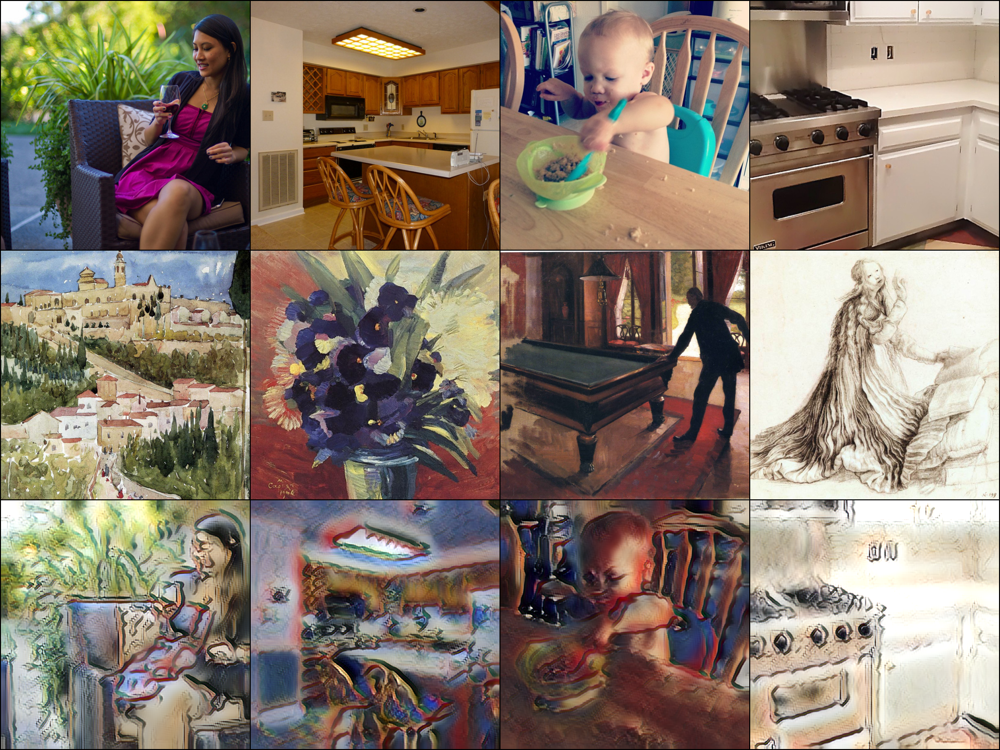

# Final Output

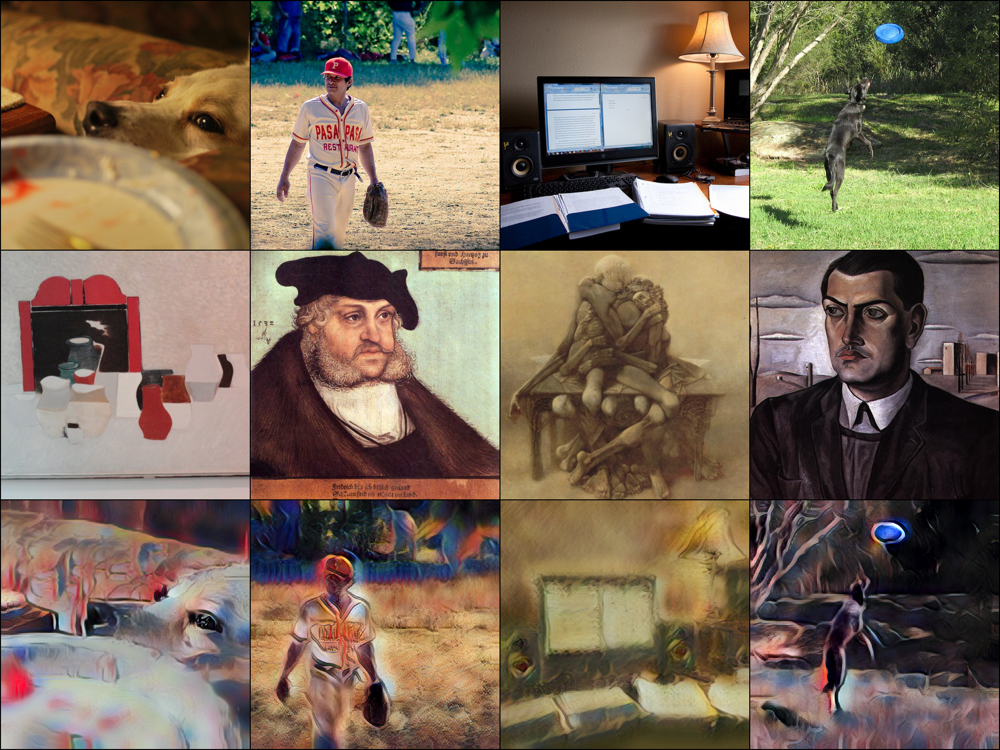